# Выпускная квалификационная работа по курсу "Data Science".
# Тема: Прогнозирование конечных свойств новых материалов (композиционных материалов).

## Предобработка данных.

### Работа с исходными файлами.

In [1]:
# загрузка библиотек
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
#загрузка данных из файла X_bp и просмотр первых 5и строк
data_bp = pd.read_excel('X_bp.xlsx', index_col=0)
data_bp.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [3]:
#просмотр описательной статистики
data_bp.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628


In [4]:
#загрузка данных из файла X_nup
data_nup = pd.read_excel('X_nup.xlsx', index_col=0)
data_nup.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,4.0,57.0
1,0,4.0,60.0
2,0,4.0,70.0
3,0,5.0,47.0
4,0,5.0,57.0


In [5]:
#просмотр описательной статистики
data_nup.describe()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1040.00000,1040.000000,1040.000000
mean,45.00000,6.911385,57.248399
std,45.02165,2.555181,12.332438
min,0.00000,0.000000,0.000000
25%,0.00000,5.102256,49.970740
50%,45.00000,6.938000,57.413594
75%,90.00000,8.587662,65.107235
max,90.00000,14.440522,103.988901


**_Заметим: количество строк в файлах разное, однако требуется объединить датасеты по принципу INNER, то есть число строк, которое должно остаться - 1023._**

In [6]:
#объединение и проверка размерности
data = data_bp.merge (data_nup, how = 'inner', left_index= True, right_index=True)
data.shape

(1023, 13)

In [7]:
data.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [8]:
data.tail()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90,6.313201,58.261074
1022,3.808020,1890.413468,417.316232,129.183416,27.474763,300.952708,758.747882,74.309704,2856.328932,194.754342,90,6.078902,77.434468


In [9]:
data.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,44.252199,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,45.015793,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,90.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,90.000000,14.440522,103.988901


In [10]:
# просмотр типа данных в столбцах
data.dtypes

Соотношение матрица-наполнитель         float64
Плотность, кг/м3                        float64
модуль упругости, ГПа                   float64
Количество отвердителя, м.%             float64
Содержание эпоксидных групп,%_2         float64
Температура вспышки, С_2                float64
Поверхностная плотность, г/м2           float64
Модуль упругости при растяжении, ГПа    float64
Прочность при растяжении, МПа           float64
Потребление смолы, г/м2                 float64
Угол нашивки, град                        int64
Шаг нашивки                             float64
Плотность нашивки                       float64
dtype: object

In [11]:
 # просмотр количества пропущенных значений в столбцах
data.isna().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [12]:
# выявление дублирующихся строк
data.duplicated(keep=False).sum()

0

In [13]:
#data = pd.get_dummies(data, columns=['Угол нашивки, град'], prefix='', prefix_sep='')

**_При анализе данных получившегося файла, можно сказать следующее:_**
- _пропуски в данных не наблюдаются_
- _дубликаты записей отсутствуют_
- _все значения являются числовыми_
- _показатель "Угол нашивки" принимает только два значения "0" и "90" градусов. При исследовании предметной области выяснилось, что этот параметр может также принимать значения "-45" и "45" градусов. Возникла дилемма: слудует ли идентифицировать переменную как категориальную и вводить два дополнительных класса, данными которого мы не располагаем, или не применять кодирование. Было принято решение оставить параметр вещественным исходя из его физического смысла._
- _странным фактом является наличие целочисленных данных в первых двадцати трех строках датасета, в то время как большинство измерений производится в формате "с плавающей точкой". Можно предположить, часть данных искуственно синтезирована, однако положимся на компетенции составителей датасета._ 

In [14]:
data.to_excel('df_merged1.xlsx') #сохранение объединенного датасета в файл excel

In [15]:
import ydata_profiling #посмотрим альтернативный способ получения аналитики и статистики по переменным

In [16]:
data.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Визуальное исследование датасета.

**_Построение для каждого из показателей:_**
- _гистограммы для определения плотности вероятности распределения данных_
- _межквартильного размаха для отображения одномерного распределения вероятности, визуализации выбросов._

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 
sns.set(style="ticks")

In [18]:
data.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

**_Гистограммы распределения._**

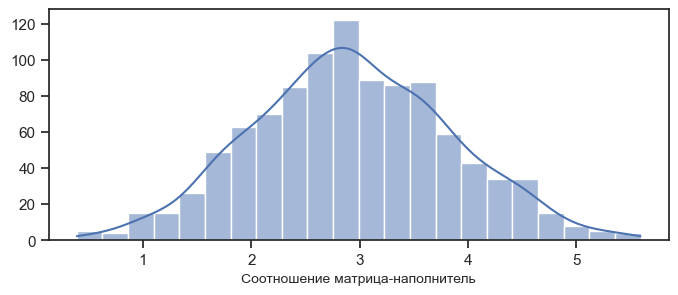

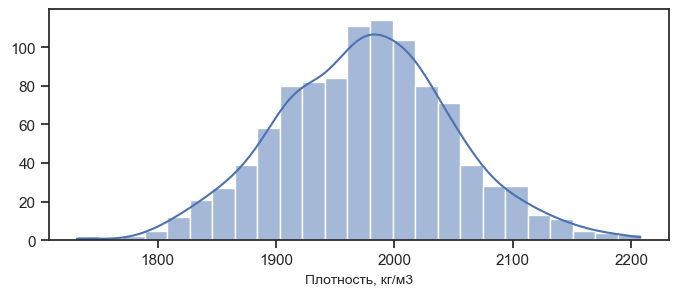

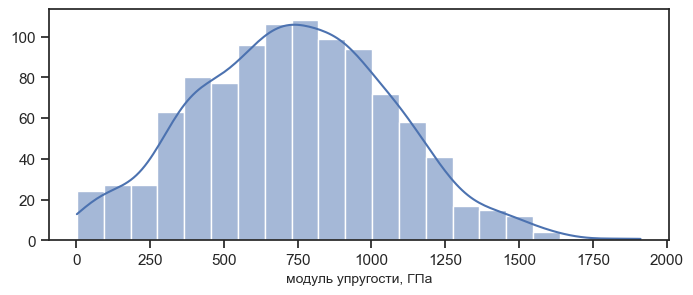

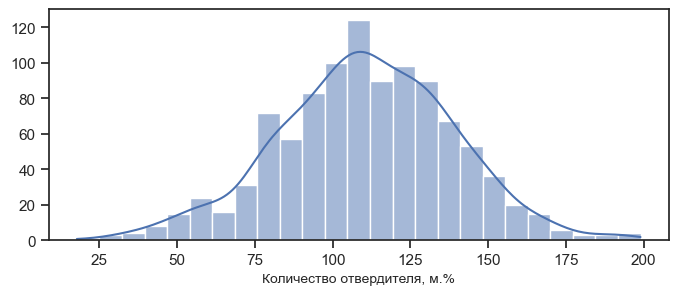

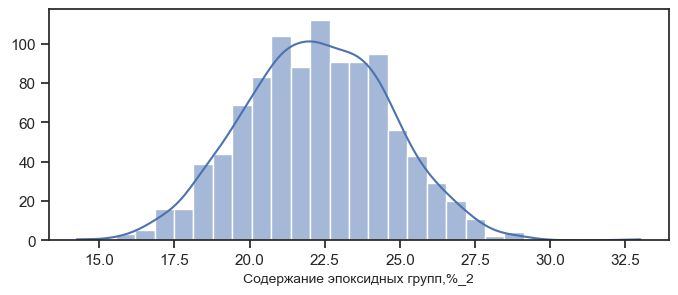

...

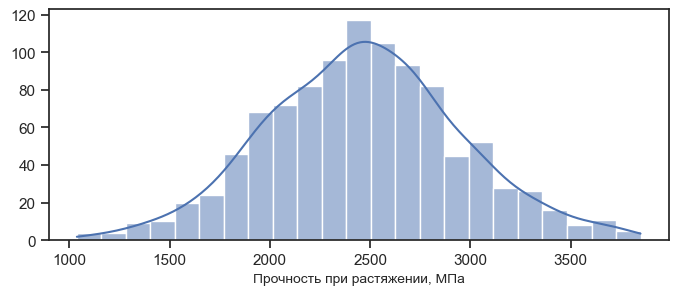

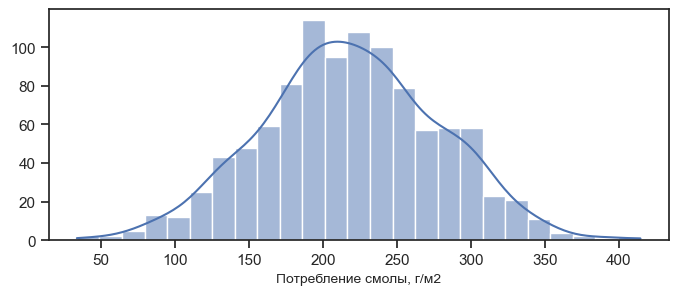

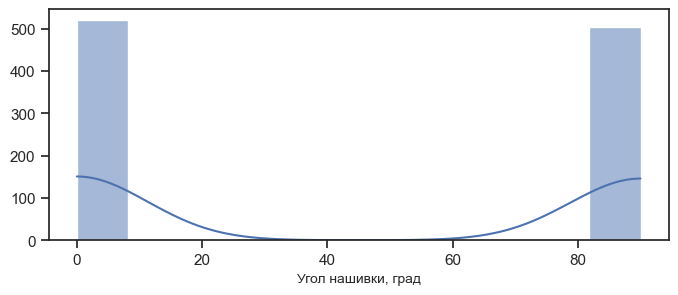

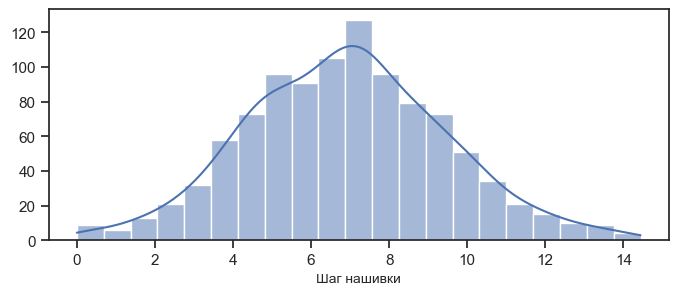

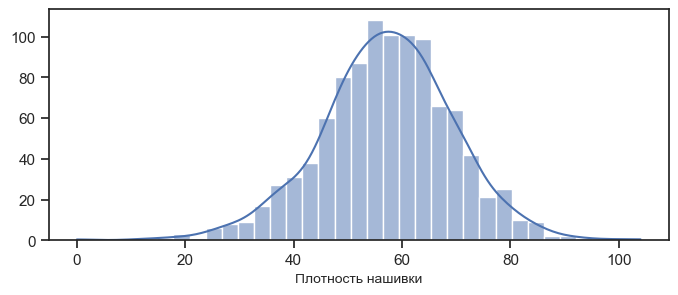

In [19]:
for col in data.columns:
    plt.figure (figsize = (8, 3))
    sns.histplot(data = data[col], kde = True)
    plt.ylabel (None)
    plt.xlabel(col, size = 10)
    plt.show()

**Гистограммы на первый взгляд имеют нормальное распределение, однако можно наблюдать смещение. Необходимо рассмотреть межквартильный размах.**


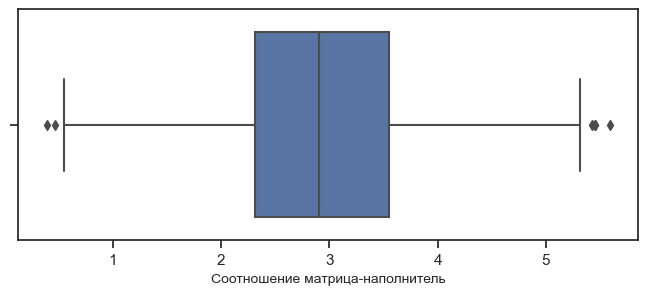

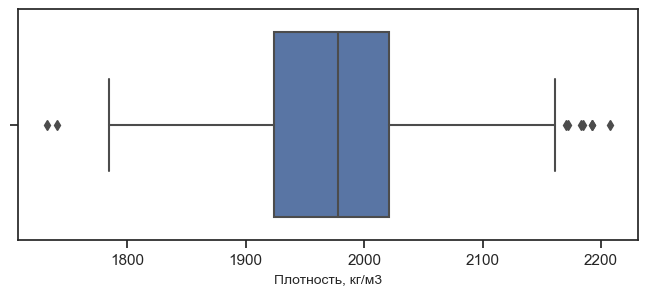

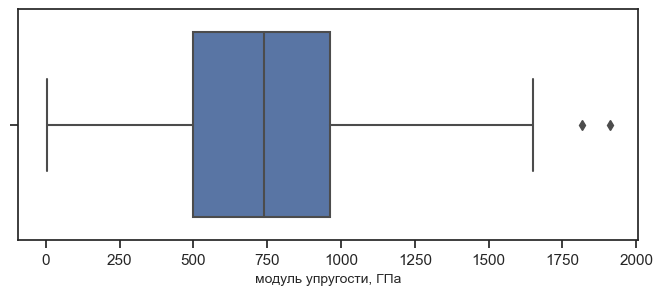

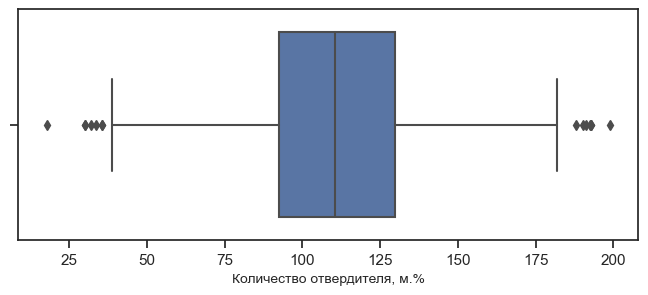

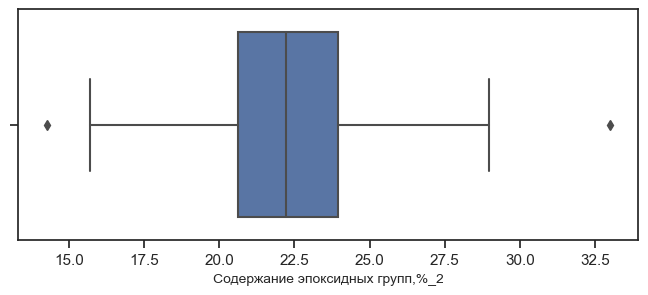

...

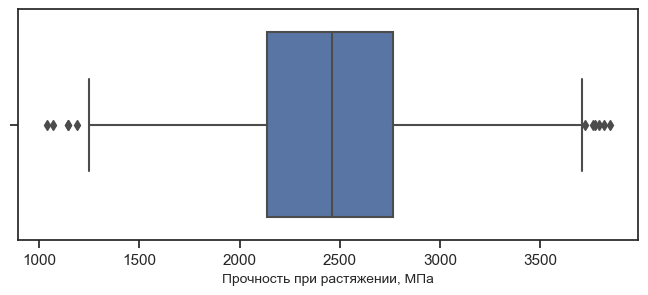

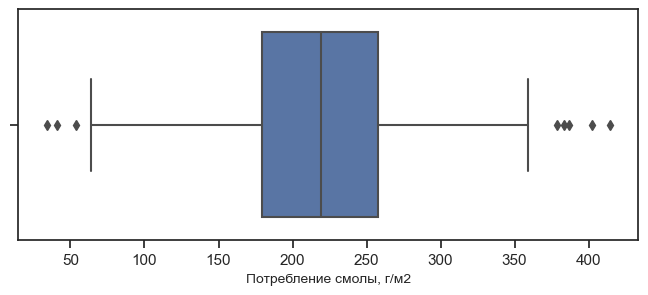

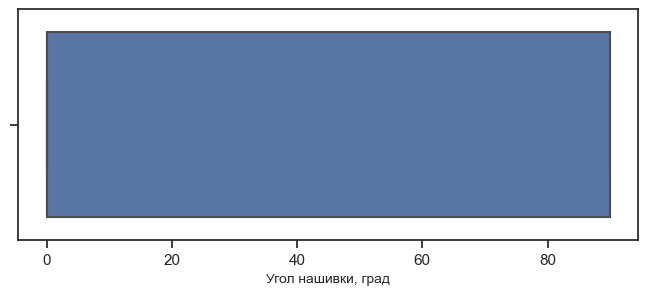

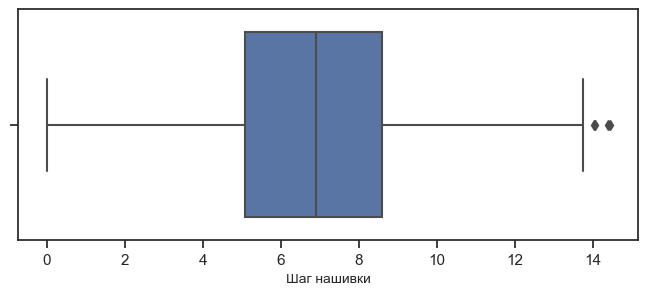

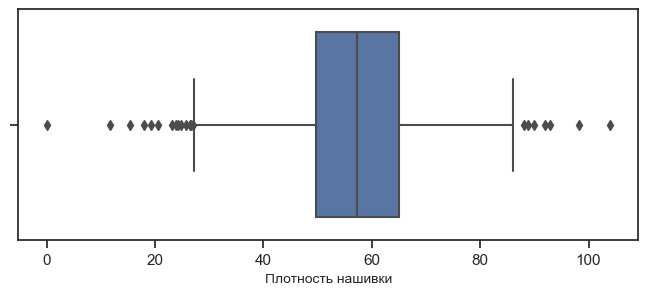

In [20]:
for col in data.columns:
    plt.figure (figsize = (8,3))
    sns.boxplot (data = data, x= data[col], color='b')
    plt.xlabel (col, fontsize = 10)

**На вышеприведенных графиках можно наблюдать наличие аномальных значений в виде точек за усами графика (значения вне интерквартильного интервала).**

### Анализ выбросов данных, нормализация и корреляционная матрица.

In [21]:
import scipy.stats as stats

In [22]:
# анализ стандартизированной оценки (Z- оценки)
z = np.abs(stats.zscore(data))
df2 = data[(z<3).all(axis=1)]

df2.shape

(999, 13)

In [23]:
#межквартильный размах - разброс данных вокруг медианы
Q25 = data.quantile (q=.25)
Q75 = data.quantile (q=.75)
IQR = data.apply (stats.iqr)

df = data[~((data < ( Q25-1.5*IQR)) | (data > ( Q75+1.5*IQR))).any(axis=1)]
df.shape

(936, 13)

**_При расчете z-оценки количество выбросов составляет 23 строки, при межквартильном размахе - 86, что эквивалентно ~12% всех данных. Несмотря на то, что это внушительная часть данных, применим отсечение выбросов именно этим параметром. В целом гистограммы распределены нормально, но местами присутствует смещение, что предполагает использование данного метода. Предположительно после исключения выбросов сформируются новые аномалии, однако первично уже скорее всего исключены ошибки в данных, а далбнейшая очистка может привести к искажению модели._**

In [24]:
df.to_excel('df_.xlsx') #сохранение очищенного датасета в файл excel

**_Проверка очищенных данных на нормальность при применении преобразования Йео-Джонсона:_**
- _построение гистограмм до/после_
- _постороение графиков QQ (квантиль-квантиль)_
- _проведение теста на нормальность Шапиро - Уилка_

_Преобразование Йео-Джонсона используется исходя из того, что показатель "Угол нашивки" принят как вещественный с возможными отрицательными и нулевыми значениями._

In [25]:
from sklearn.preprocessing import PowerTransformer

In [26]:
yeo = PowerTransformer(method='yeo-johnson', standardize=True) #распределение приведено к стандартному (вычитание среднего и масштабирование дисперсией)
data_norm = pd.DataFrame(yeo.fit_transform(df), columns=df.columns) # нормализуем датасет
data_norm.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,-1.201352,0.791085,0.037864,-2.184100,0.647758,-0.032071,-0.937592,-1.094193,1.141432,0.041602,-1.023787,-1.163563,0.216560
1,-1.201352,0.791085,0.037864,0.662999,-0.394297,0.357901,-0.937592,-1.094193,1.141432,0.041602,-1.023787,-0.756537,-0.934116
2,-0.157379,0.791085,0.080442,0.018783,0.031864,-0.032071,-0.937592,-1.094193,1.141432,0.041602,-1.023787,-0.756537,-0.051774
3,-0.161209,0.367681,0.065530,0.018783,0.031864,-0.032071,-0.937592,-1.094193,1.141432,0.041602,-1.023787,-0.756537,0.216560
4,-0.384536,-0.904696,0.240600,0.018783,0.031864,-0.032071,-0.937592,-1.094193,1.141432,0.041602,-1.023787,-0.756537,1.121797


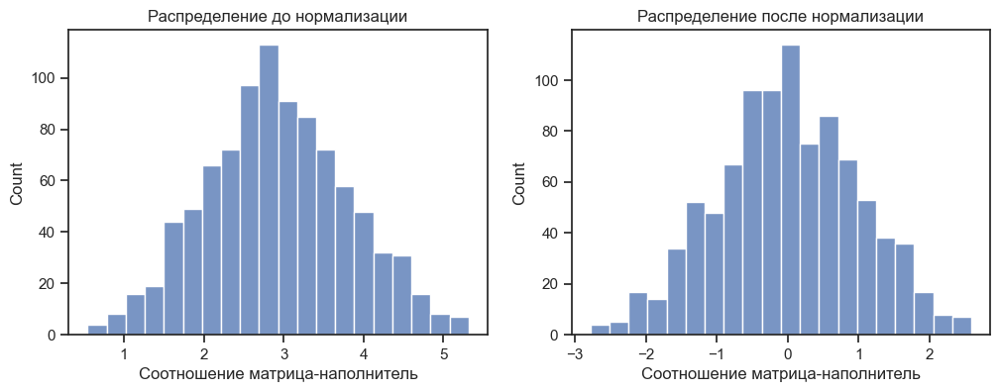

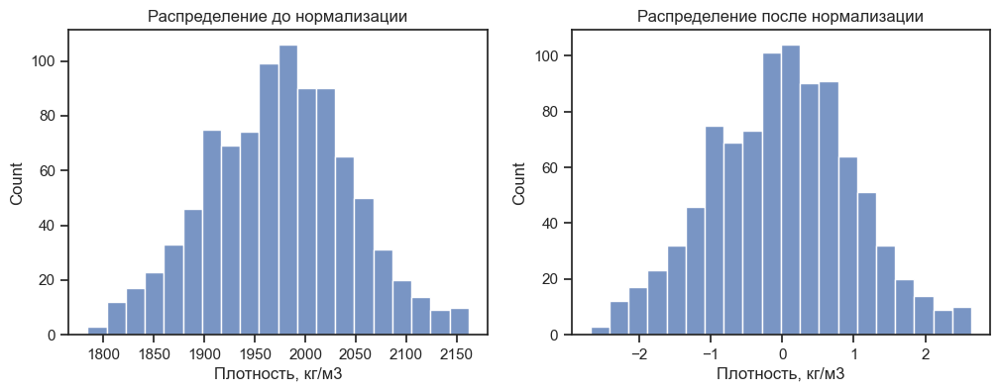

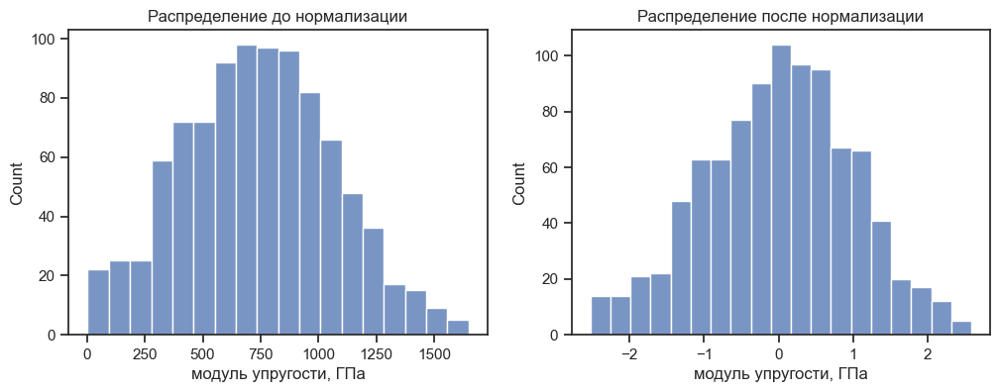

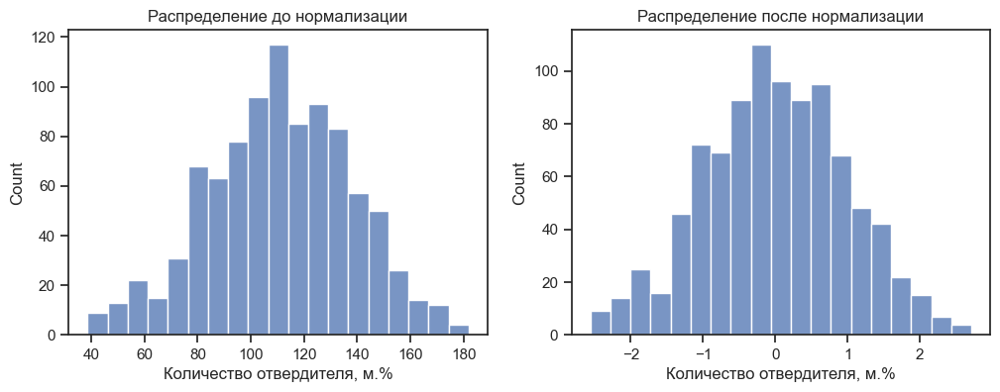

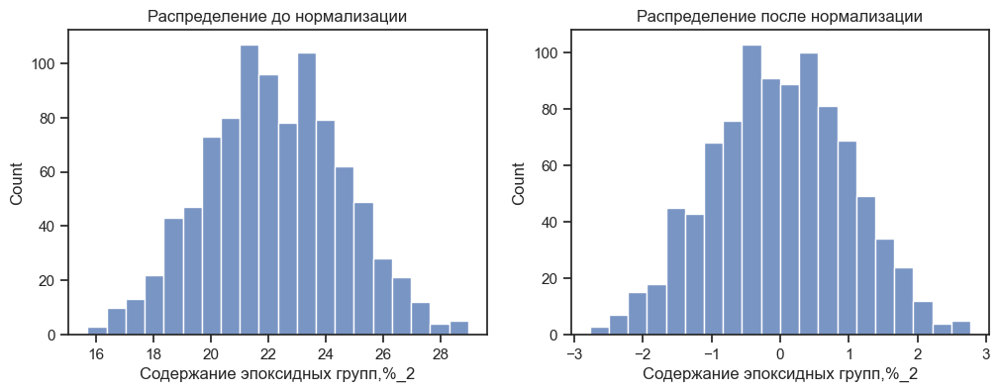

...

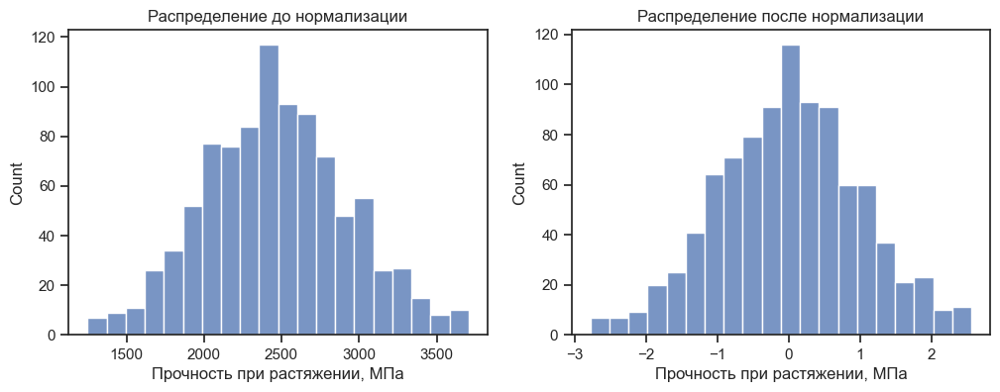

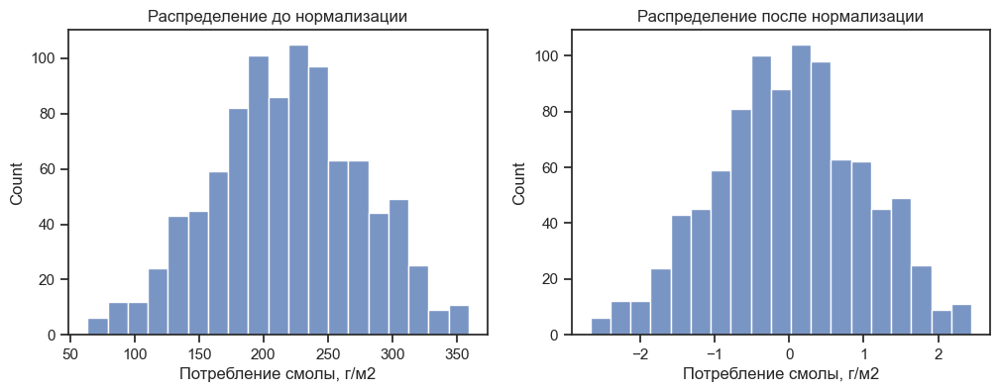

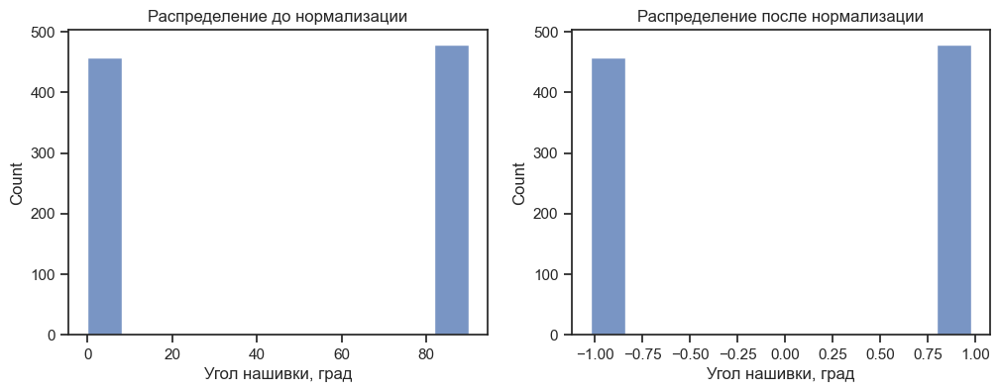

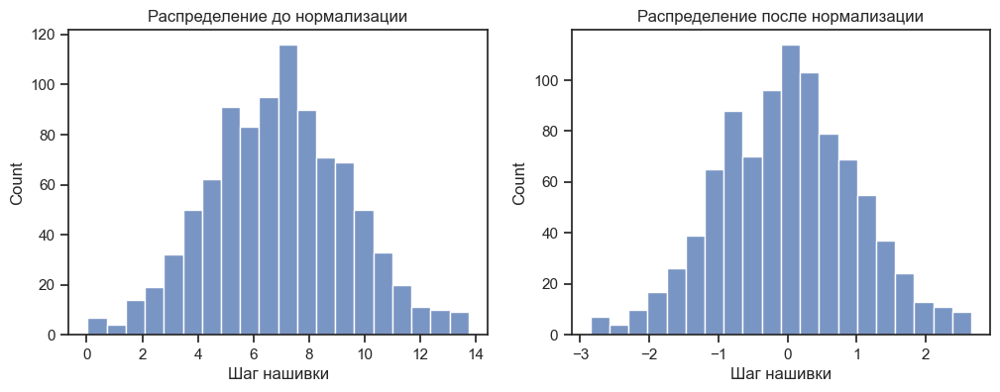

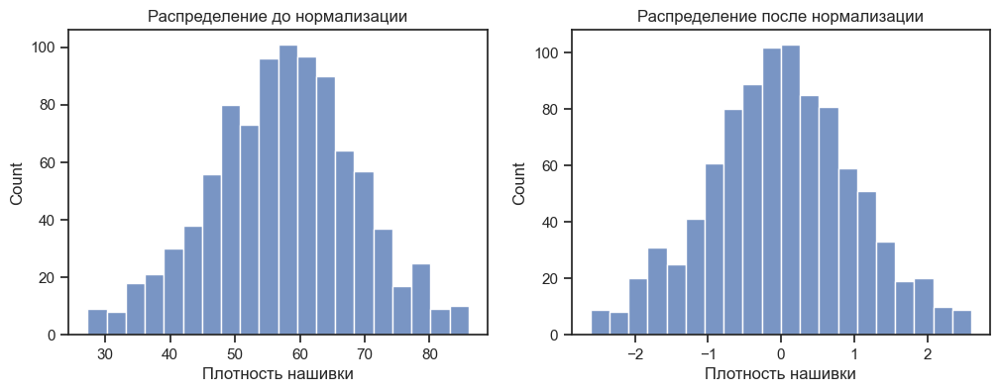

In [27]:
for col in data_norm.columns:
    plt.figure(figsize=(12,4))
    plt.subplot(121)
    sns.histplot(df[col]).set_title('Распределение до нормализации')
    plt.subplot(122)
    sns.histplot(data_norm[col]).set_title('Распределение после нормализации')

**_Построение QQ графиков для каждого из параметров в своих координатах._**

In [28]:
from scipy import stats

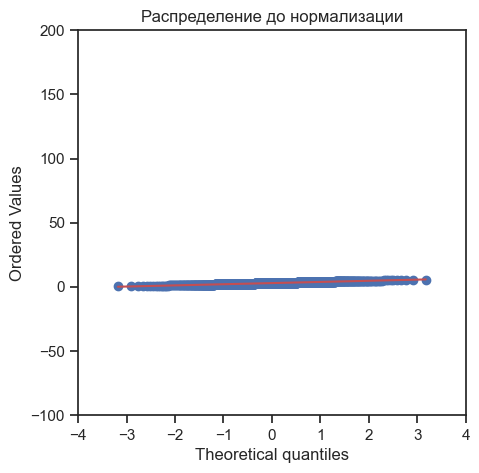

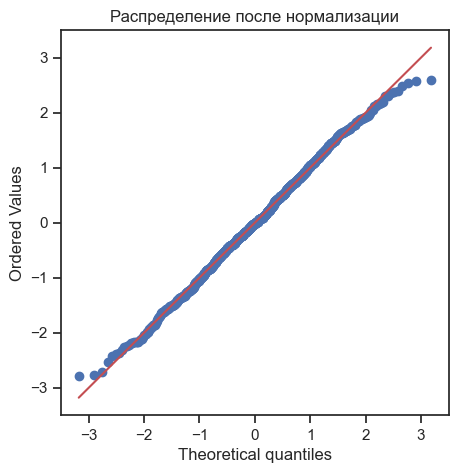

In [29]:
plt.figure(figsize=(5,5))
stats.probplot(df['Соотношение матрица-наполнитель'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, -100, 200]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Соотношение матрица-наполнитель'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

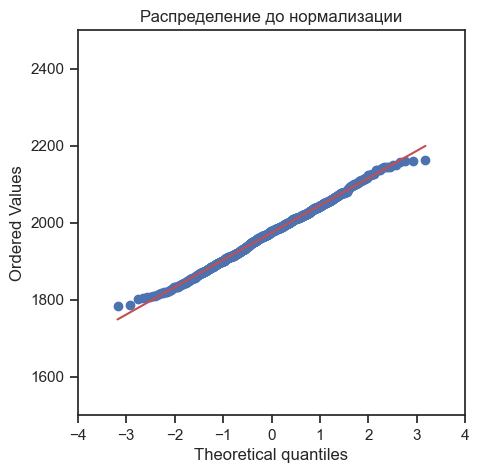

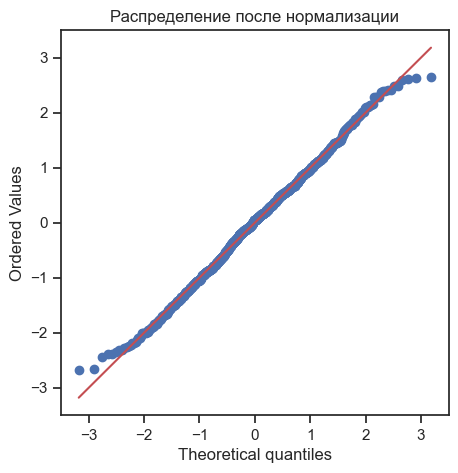

In [30]:
plt.figure(figsize=(5,5))
stats.probplot(df['Плотность, кг/м3'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, 1500, 2500]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Плотность, кг/м3'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

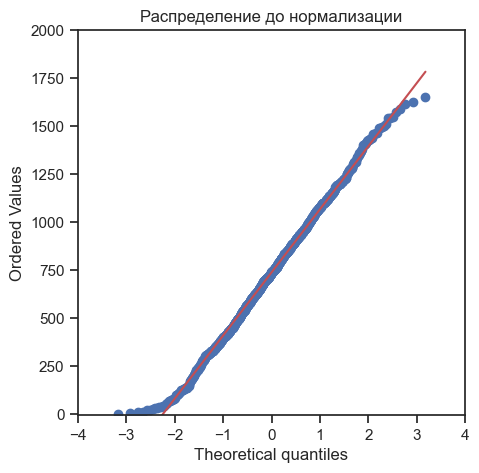

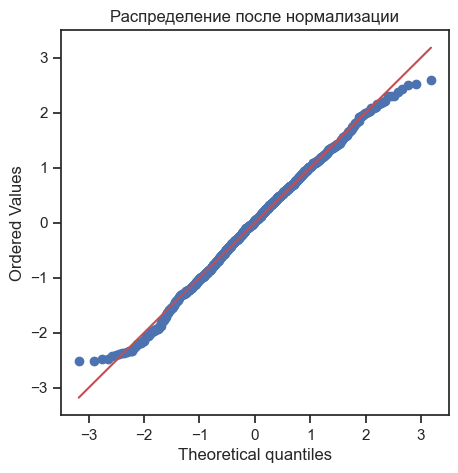

In [31]:
plt.figure(figsize=(5,5))
stats.probplot(df['модуль упругости, ГПа'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, -5, 2000]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['модуль упругости, ГПа'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

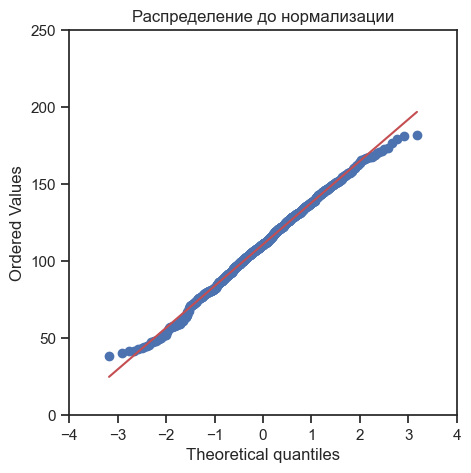

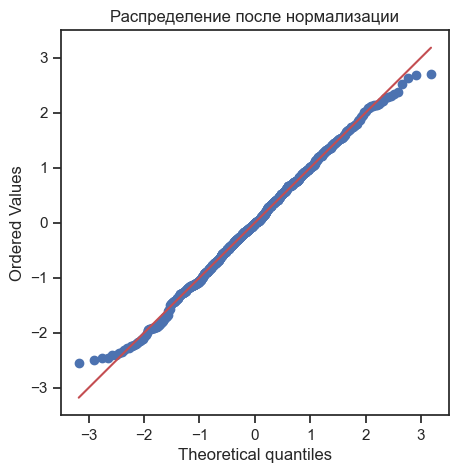

In [32]:
plt.figure(figsize=(5,5))
stats.probplot(df['Количество отвердителя, м.%'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, 0, 250]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Количество отвердителя, м.%'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

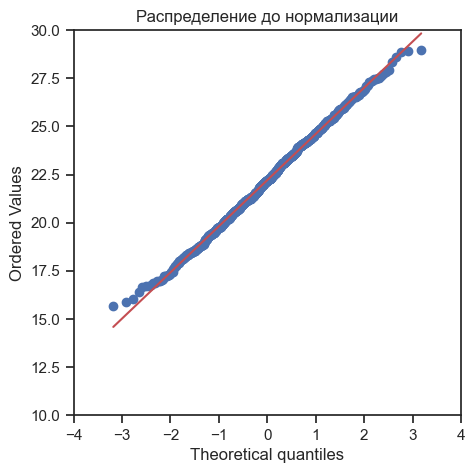

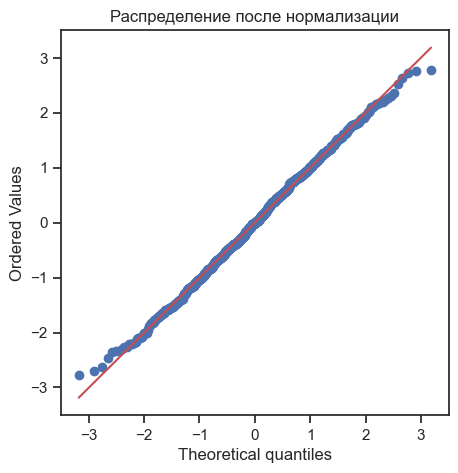

In [33]:
plt.figure(figsize=(5,5))
stats.probplot(df['Содержание эпоксидных групп,%_2'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, 10, 30]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Содержание эпоксидных групп,%_2'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

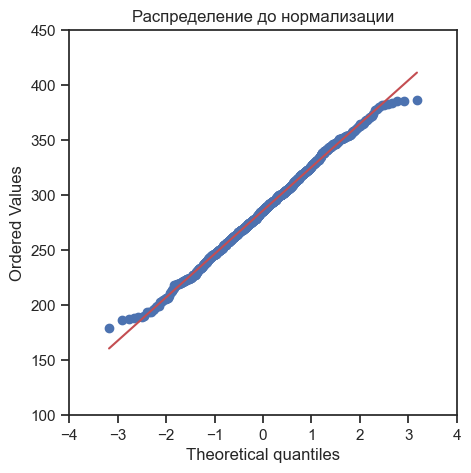

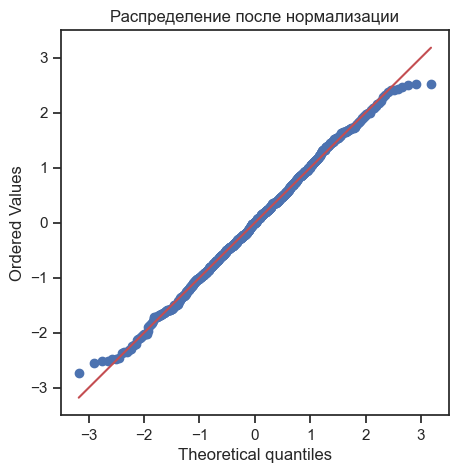

In [34]:
plt.figure(figsize=(5,5))
stats.probplot(df['Температура вспышки, С_2'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, 100, 450]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Температура вспышки, С_2'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

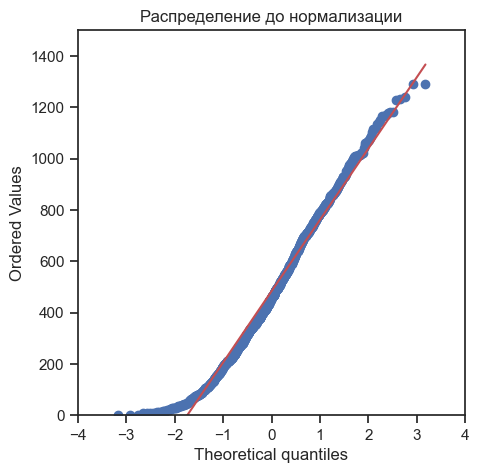

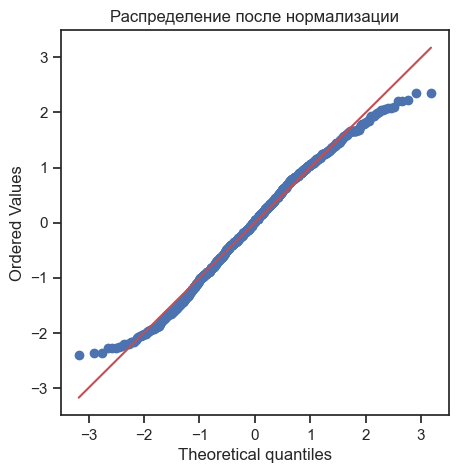

In [35]:
plt.figure(figsize=(5,5))
stats.probplot(df['Поверхностная плотность, г/м2'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, 0, 1500]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Поверхностная плотность, г/м2'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

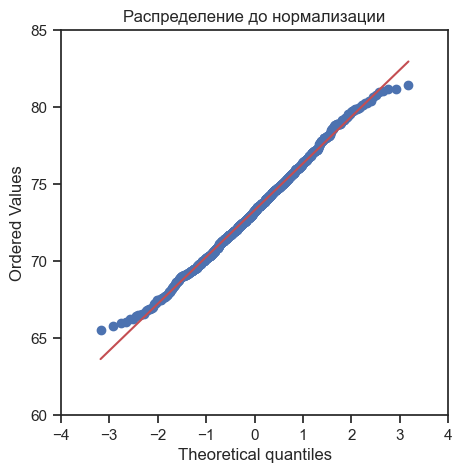

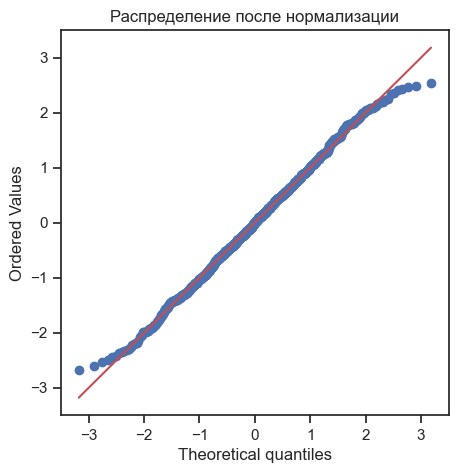

In [36]:
plt.figure(figsize=(5,5))
stats.probplot(df['Модуль упругости при растяжении, ГПа'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, 60, 85]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Модуль упругости при растяжении, ГПа'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

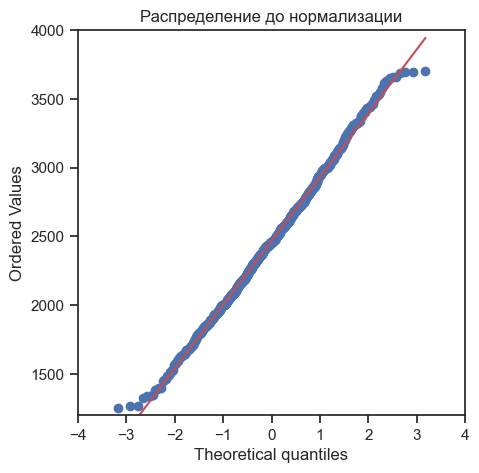

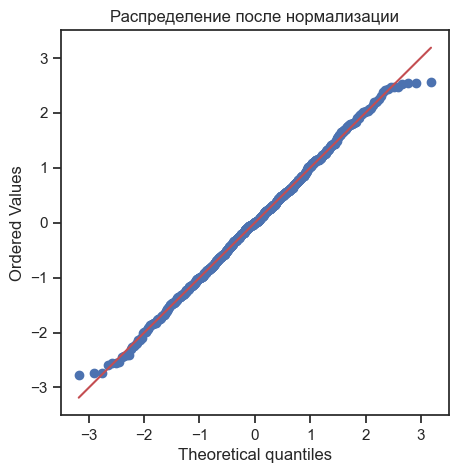

In [37]:
plt.figure(figsize=(5,5))
stats.probplot(df['Прочность при растяжении, МПа'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, 1200, 4000]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Прочность при растяжении, МПа'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

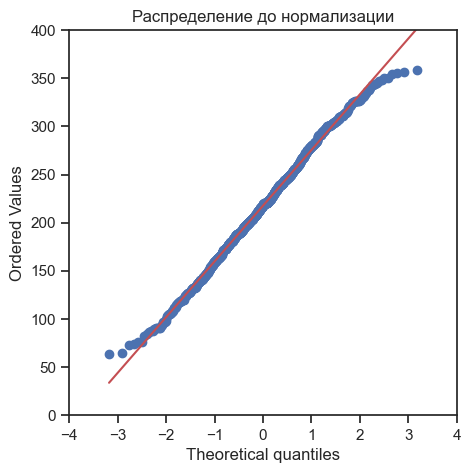

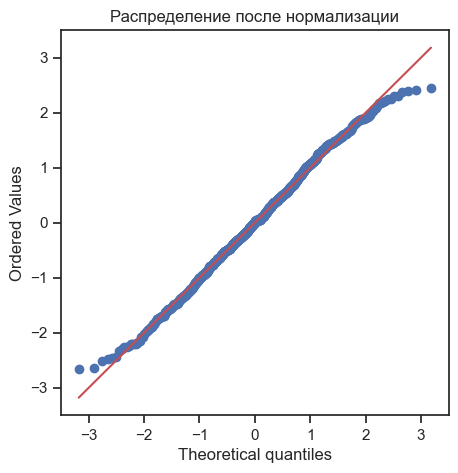

In [38]:
plt.figure(figsize=(5,5))
stats.probplot(df['Потребление смолы, г/м2'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, 0, 400]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Потребление смолы, г/м2'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

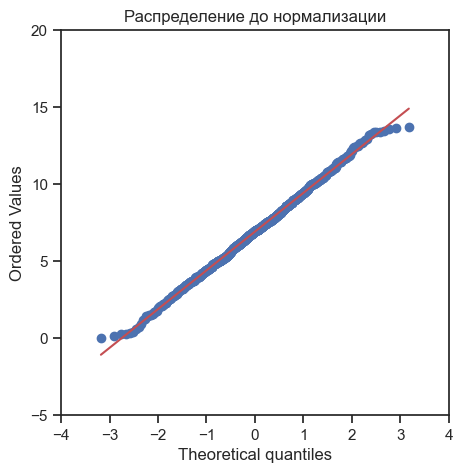

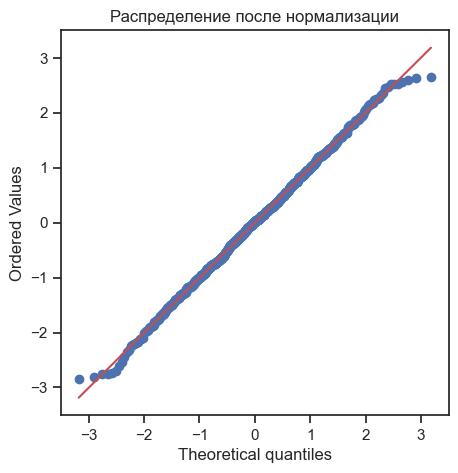

In [39]:
plt.figure(figsize=(5,5))
stats.probplot(df['Шаг нашивки'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, -5, 20]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Шаг нашивки'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

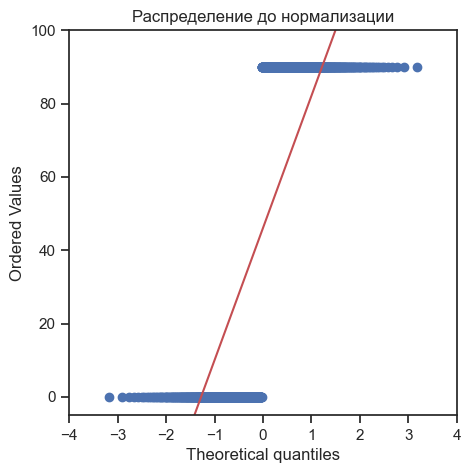

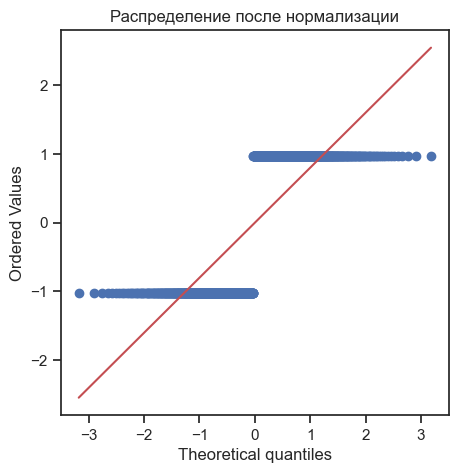

In [40]:
plt.figure(figsize=(5,5))
stats.probplot(df['Угол нашивки, град'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, -5, 100]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Угол нашивки, град'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

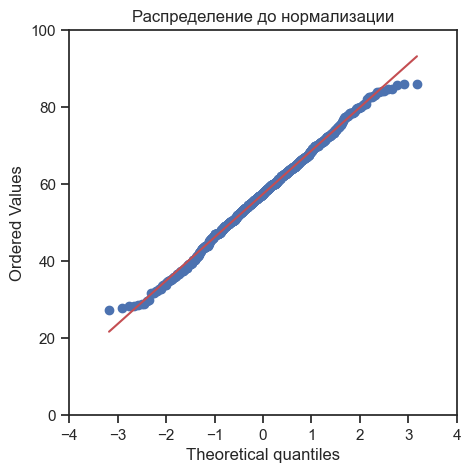

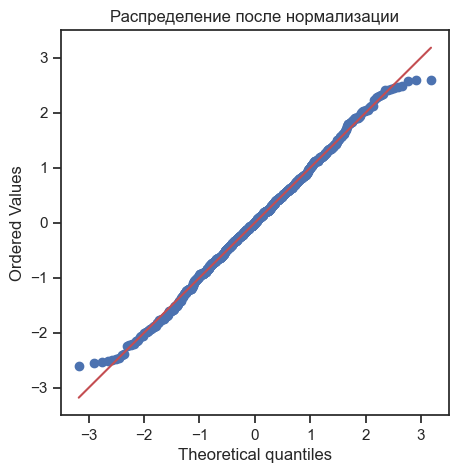

In [41]:
plt.figure(figsize=(5,5))
stats.probplot(df['Плотность нашивки'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, 0, 100]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Плотность нашивки'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

**_Тест Шапиро-Уилка на нормальность._**

In [42]:
from scipy.stats import shapiro

In [43]:
for col in df.columns:
    shapiro (df [col])
    print (col)
    print (shapiro (df [col]))

Соотношение матрица-наполнитель
ShapiroResult(statistic=0.9970774054527283, pvalue=0.08666662871837616)
Плотность, кг/м3
ShapiroResult(statistic=0.9971369504928589, pvalue=0.09497813135385513)
модуль упругости, ГПа
ShapiroResult(statistic=0.9953528046607971, pvalue=0.006088397465646267)
Количество отвердителя, м.%
ShapiroResult(statistic=0.9962779879570007, pvalue=0.025072956457734108)
Содержание эпоксидных групп,%_2
ShapiroResult(statistic=0.9977485537528992, pvalue=0.23661871254444122)
Температура вспышки, С_2
ShapiroResult(statistic=0.9970681071281433, pvalue=0.0854324996471405)
Поверхностная плотность, г/м2
ShapiroResult(statistic=0.9777225255966187, pvalue=8.982355831355093e-11)
Модуль упругости при растяжении, ГПа
ShapiroResult(statistic=0.9962244629859924, pvalue=0.02307675965130329)
Прочность при растяжении, МПа
ShapiroResult(statistic=0.9970090985298157, pvalue=0.07800609618425369)
Потребление смолы, г/м2
ShapiroResult(statistic=0.9959738850593567, pvalue=0.01567118987441063)


**_До обработки 6 из 13 показателей не проходят пороговое значение p-value < 0.05_**

In [44]:
for col in data_norm.columns:
    shapiro(data_norm [col])
    print (col)
    print (shapiro (data_norm [col]))

Соотношение матрица-наполнитель
ShapiroResult(statistic=0.9974379539489746, pvalue=0.1500064581632614)
Плотность, кг/м3
ShapiroResult(statistic=0.9971350431442261, pvalue=0.09470080584287643)
модуль упругости, ГПа
ShapiroResult(statistic=0.9957846999168396, pvalue=0.011722661554813385)
Количество отвердителя, м.%
ShapiroResult(statistic=0.9970081448554993, pvalue=0.07789332419633865)
Содержание эпоксидных групп,%_2
ShapiroResult(statistic=0.9978112578392029, pvalue=0.25866833329200745)
Температура вспышки, С_2
ShapiroResult(statistic=0.9970903396606445, pvalue=0.0884123370051384)
Поверхностная плотность, г/м2
ShapiroResult(statistic=0.9903289675712585, pvalue=7.90928697824711e-06)
Модуль упругости при растяжении, ГПа
ShapiroResult(statistic=0.9970969557762146, pvalue=0.08931748569011688)
Прочность при растяжении, МПа
ShapiroResult(statistic=0.997805118560791, pvalue=0.25644078850746155)
Потребление смолы, г/м2
ShapiroResult(statistic=0.9959717988967896, pvalue=0.015621570870280266)
Уго

**_После нормализации 4 из 13 показателей не проходят пороговое значение p-value < 0.05, одним из которых является "Угол нашивки", другие:_**
- _модуль упругости, ГПа_
- _Поверхностная плотность, г/м2_
- _Потребление смолы, г/м2_

_Проверка нормальности статистическими тестами является очень строгой, это связано со сравнением с идеальным распределением. Поэтому, несмотря на то, что статистический тест говорит о ненормальности распределения, всегда стоит смотреть на гистограмму распределения._

_**Тепловая карта корреляции Пирсона.**_

<AxesSubplot:>

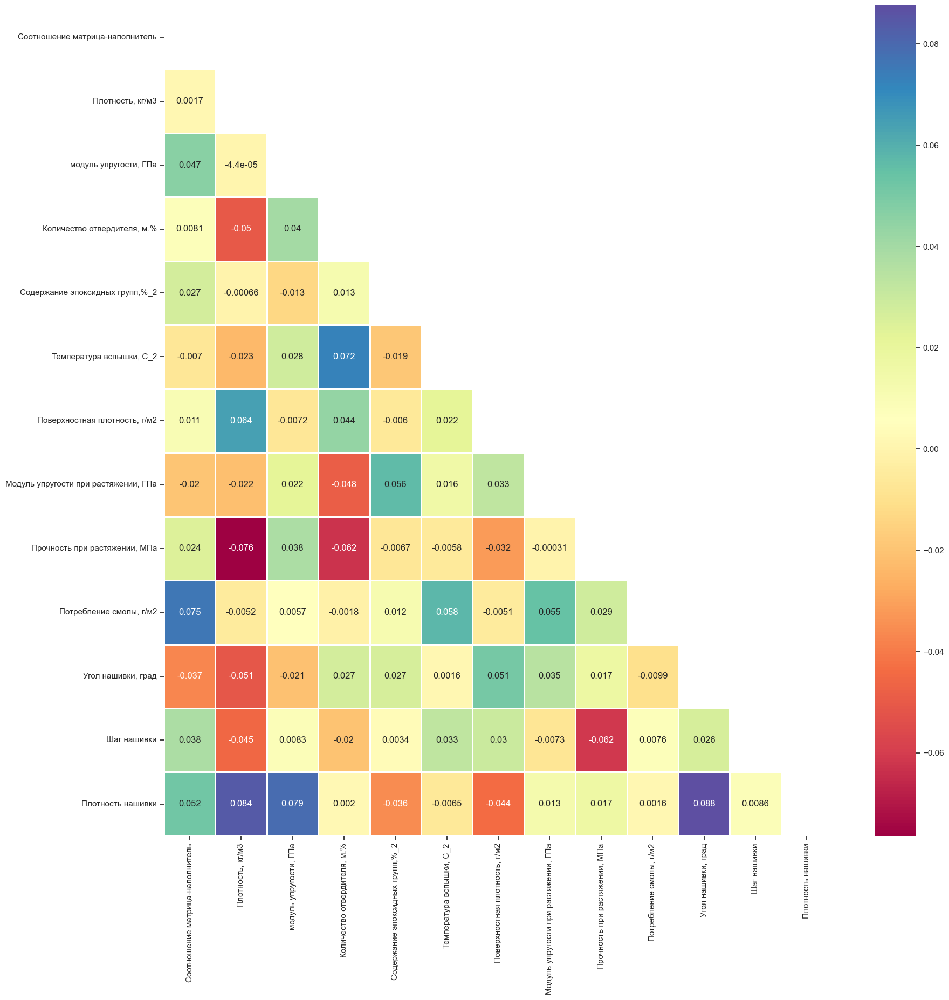

In [45]:
matrix = np.triu (data_norm.corr())
plt.figure (figsize = (20, 20))
sns.heatmap (data_norm.corr(), annot = True, cmap = 'Spectral', linewidths =1, linecolor = 'white', mask = matrix)

**_Корреляционная матрица показывает полное отсутствие линейно связанных параметров. Причем это касается как связи между входными переменными и прогнозируемыми, так и входными между собой. Последнее позволяет включить все входные параметры в модели регрессии, однако можно предположить, что построение достоверного прогноза будет затруднительным._**

In [46]:
data_norm.to_excel('data_norm.xlsx') #сохранение очищенного датасета в файл excel

## Обучение регрессионных моделей прогноза для показателей:
- **_Модуль упругости при растяжении, ГПа_**
- **_Прочность при растяжении, МПа_**

### Выбор метрик.

In [47]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_squared_log_error, median_absolute_error, r2_score


In [48]:
class MetricLogger:
    
    def __init__(self):
        self.df = pd.DataFrame(
            {'metric': pd.Series([], dtype='str'),
            'alg': pd.Series([], dtype='str'),
            'value': pd.Series([], dtype='float')})

    def add(self, metric, alg, value):
        # Удаление значения если оно уже было ранее добавлено
        self.df.drop(self.df[(self.df['metric']==metric)&(self.df['alg']==alg)].index, inplace = True)
        # Добавление нового значения
        temp = [{'metric':metric, 'alg':alg, 'value':value}]
        self.df = self.df.append(temp, ignore_index=True)

In [49]:
# Сохранение метрик
regrMetricLogger = MetricLogger()

### Формирование обучающей и тестовой выборок для параметров "Модуль упругости при растяжении, ГПа" и "Прочность при растяжении, МПа".

_Разделение выборки на проверочную и обучающую в соотношении 70/30, исключая из датасета всех целевых параметров: "Модуля упругости при растяжении", "Прочности при растяжении" и "Соотношения матрица - наполнитель"._

In [50]:
from sklearn.model_selection import train_test_split

In [51]:
x_mod = data_norm.drop(['Соотношение матрица-наполнитель', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'], axis=1)
x_pr = data_norm.drop(['Соотношение матрица-наполнитель', 'Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа'], axis=1)
y_mod = data_norm[['Модуль упругости при растяжении, ГПа']]
y_pr = data_norm[['Прочность при растяжении, МПа']]

X_train_mod, X_test_mod, y_train_mod, y_test_mod = train_test_split(x_mod, y_mod, test_size=0.3, random_state=1)
X_train_pr, X_test_pr, y_train_pr, y_test_pr = train_test_split(x_pr, y_pr, test_size=0.3, random_state=1)
# перемешивание строк датасета с расположением в случайном порядке

In [52]:
# проверка разделения выборок
print ('Модуль упругости при растяжении, ГПа')
print ('name', '\t','rows','columns')
print ('data    ', data_norm.shape)
print ('x train ', X_train_mod.shape)
print ('x test  ', X_test_mod.shape)
print ('y train ', y_train_mod.shape)
print ('y test  ', y_test_mod.shape)

Модуль упругости при растяжении, ГПа
name 	 rows columns
data     (936, 13)
x train  (655, 10)
x test   (281, 10)
y train  (655, 1)
y test   (281, 1)


In [53]:
# проверка разделения выборок
print ('Прочность при растяжении, МПа')
print ('name', '\t','rows','columns')
print ('data    ', data_norm.shape)
print ('x train ', X_train_pr.shape)
print ('x test  ', X_test_pr.shape)
print ('y train ', y_train_pr.shape)
print ('y test  ', y_test_pr.shape)

Прочность при растяжении, МПа
name 	 rows columns
data     (936, 13)
x train  (655, 10)
x test   (281, 10)
y train  (655, 1)
y test   (281, 1)


### Прогнозирование параметра "Модуль упругости при растяжении, ГПа".

**Построение базового решения моделей без подбора гиперпараметров.**
Обучение моделей производится на основе обучающей выборки, оценка качества - на основе тестовой выборки.

In [54]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor

**Оценка качества базового решения для предсказания 'Модуля упругости при растяжении, ГПа'.**

In [55]:
# Выбранные модели
regr_models = {'LR': LinearRegression(),
               'L1': Lasso(alpha = 0.2),
               'L2': Ridge(alpha = 0.2),
               'KNN_5':KNeighborsRegressor(n_neighbors=5),
               'SVR':SVR(),
               'Tree':DecisionTreeRegressor(),
               'RF':RandomForestRegressor(),
               'GB':GradientBoostingRegressor(),
               }

In [56]:
def regr_train_model_m(model_name, model, regrMetricLogger):
    model.fit(X_train_mod, y_train_mod.values.ravel())
    Y_pred_mod = model.predict(X_test_mod)
    
    mae = mean_absolute_error(y_test_mod, Y_pred_mod)
    mse = mean_squared_error(y_test_mod, Y_pred_mod)
    r2 = r2_score(y_test_mod, Y_pred_mod)

    regrMetricLogger.add('MAE', model_name, mae)
    regrMetricLogger.add('MSE', model_name, mse)
    regrMetricLogger.add('R2', model_name, r2)    
    
    print('{} \t MAE={}, MSE={}, R2={}'.format(
        model_name, round(mae, 3), round(mse, 3), round(r2, 3)))

In [57]:
import warnings
warnings.filterwarnings("default", category=FutureWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)

In [58]:
for model_name, model in regr_models.items():
    regr_train_model_m(model_name, model, regrMetricLogger)

LR 	 MAE=0.839, MSE=1.037, R2=-0.02
L1 	 MAE=0.83, MSE=1.017, R2=-0.001
L2 	 MAE=0.839, MSE=1.037, R2=-0.02
KNN_5 	 MAE=0.922, MSE=1.27, R2=-0.249
SVR 	 MAE=0.897, MSE=1.201, R2=-0.182
Tree 	 MAE=1.197, MSE=2.186, R2=-1.15
RF 	 MAE=0.842, MSE=1.098, R2=-0.08
GB 	 MAE=0.894, MSE=1.192, R2=-0.173


**Коэффициент детерминации во всех моделях отрицательный. Это свидетельствует о том, что построенные модели очень плохо описывают данные и зависимости в них.**

**Подбор гиперпараметров для показателя "Модуль упругости при растяжении, ГПа":**
_При оценке базовых моделей выяснилось: по входящим параметрам невозможно построить достоверный прогноз расчета модуля упругости. Модели линейной регрессси дают околонулевое значение коэффициента детерминации, на втором месте стоит модель случайного леса. Возможно, при подборе гиперпараметров модель может дать лучший результат._

In [59]:
from sklearn.model_selection import GridSearchCV

In [60]:
parameters_rf_mod = {
    'n_estimators': [50, 60, 70], #число деревьев
    'max_depth': [4, 5, 6, 7], # максимальная глубина деревьев
    'criterion': ['squared_error', 'absolute_error'],
    'max_features': ['auto', 'sqrt', 'log2']}

In [61]:
rf_model = RandomForestRegressor()

grid_search_rf = GridSearchCV(estimator = rf_model, param_grid = parameters_rf_mod, n_jobs=-1, cv=10)
grid_search_rf.fit(X_train_mod, y_train_mod.values.ravel()) 
best_rf_model = grid_search_rf.best_estimator_ 

grid_search_rf.best_params_

{'criterion': 'absolute_error',
 'max_depth': 6,
 'max_features': 'sqrt',
 'n_estimators': 70}

In [62]:
y_pred_mod_rf = best_rf_model.predict(X_test_mod)

print('MAE:', mean_absolute_error(y_test_mod, y_pred_mod_rf))
print('MSE:', mean_squared_error(y_test_mod, y_pred_mod_rf)) 
print('r2:', r2_score(y_test_mod, y_pred_mod_rf))

MAE: 0.8470789202642218
MSE: 1.061054749063297
r2: -0.04376460004657701


Коэффициент детерминации увеличился незначительно.

### Прогнозирование параметра "Прочность при растяжении, МПа".

#### **Оценка качества базового решения для предсказания "Прочности при растяжении, МПа".**

In [63]:
def regr_train_model_pr(model_name, model, regrMetricLogger):
    model.fit(X_train_pr, y_train_pr.values.ravel())
    Y_pred_pr = model.predict(X_test_pr)
    
    mae = mean_absolute_error(y_test_pr, Y_pred_pr)
    mse = mean_squared_error(y_test_pr, Y_pred_pr)
    r2 = r2_score(y_test_pr, Y_pred_pr)

    regrMetricLogger.add('MAE', model_name, mae)
    regrMetricLogger.add('MSE', model_name, mse)
    regrMetricLogger.add('R2', model_name, r2)    
    
    print('{} \t MAE={}, MSE={}, R2={}'.format(
        model_name, round(mae, 3), round(mse, 3), round(r2, 3)))

In [64]:
for model_name, model in regr_models.items():
    regr_train_model_pr(model_name, model, regrMetricLogger)

LR 	 MAE=0.796, MSE=0.979, R2=-0.006
L1 	 MAE=0.794, MSE=0.983, R2=-0.01
L2 	 MAE=0.796, MSE=0.979, R2=-0.006
KNN_5 	 MAE=0.849, MSE=1.153, R2=-0.186
SVR 	 MAE=0.84, MSE=1.112, R2=-0.143
Tree 	 MAE=1.087, MSE=1.875, R2=-0.927
RF 	 MAE=0.814, MSE=0.997, R2=-0.025
GB 	 MAE=0.83, MSE=1.034, R2=-0.063


**Базовые модели не могут решить поставленную задачу.**

**Подбор гиперпараметров для показателя "Прочность при растяжении, МПа":**
_При оценке базовых моделей выяснилось: по входящим параметрам невозможно построить достоверный прогноз расчета прочности при растяжениии. Модели линейной регрессси дают околонулевое значение коэффициента детерминации. Возможно, при подборе гиперпараметров метод К-ближайших соседей может дать лучший результат._

In [65]:
n_range = np.array(range(1,500,12))
tuned_parameters = [{'n_neighbors': n_range}]
tuned_parameters

[{'n_neighbors': array([  1,  13,  25,  37,  49,  61,  73,  85,  97, 109, 121, 133, 145,
         157, 169, 181, 193, 205, 217, 229, 241, 253, 265, 277, 289, 301,
         313, 325, 337, 349, 361, 373, 385, 397, 409, 421, 433, 445, 457,
         469, 481, 493])}]

In [66]:
%%time
regr_gs = GridSearchCV(KNeighborsRegressor(), tuned_parameters, cv=5, scoring='neg_mean_squared_error')
regr_gs.fit(X_train_pr, y_train_pr)

Wall time: 2.84 s


GridSearchCV(cv=5, estimator=KNeighborsRegressor(),
             param_grid=[{'n_neighbors': array([  1,  13,  25,  37,  49,  61,  73,  85,  97, 109, 121, 133, 145,
       157, 169, 181, 193, 205, 217, 229, 241, 253, 265, 277, 289, 301,
       313, 325, 337, 349, 361, 373, 385, 397, 409, 421, 433, 445, 457,
       469, 481, 493])}],
             scoring='neg_mean_squared_error')

In [67]:
regr_gs.best_estimator_

KNeighborsRegressor(n_neighbors=385)

In [68]:
y_pred_pr_kn = regr_gs.predict(X_test_pr)

print('MAE:', mean_absolute_error(y_test_pr, y_pred_pr_kn))
print('MSE:', mean_squared_error(y_test_pr, y_pred_pr_kn)) 
print('r2:', r2_score(y_test_pr, y_pred_pr_kn))

MAE: 0.7946444072765184
MSE: 0.9798669737976158
r2: -0.007100956566570282


**Коэффициент детерминации увеличился в 25 раз, однако этого все еще недостаточно для построения прогноза.**

## Рекомендательная нейронная сеть для Соотношения матрица - наполнитель.

In [69]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, LeakyReLU
from tensorflow.keras.optimizers import SGD, Adam

**Разделение выборки на проверочную и обучающую в соотношении 70/30, исключая из датасета целевой параметр: "Соотношение матрица - наполнитель".**

In [70]:
X = df.drop(['Соотношение матрица-наполнитель'], axis=1)
y = df[['Соотношение матрица-наполнитель']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [71]:
X.head()

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
3,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0
5,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,60.0
6,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,70.0


**Построение нейронной сети.**

In [72]:
from sklearn.preprocessing import StandardScaler

In [73]:
# Масштабирование признаков
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [74]:
# Создание модели
model = Sequential()
model.add(Dense(8, activation='relu', input_dim=X.shape[1]))
model.add(Dropout(0.2))
model.add(Dense(8, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(1, activation='softmax'))

In [75]:
# Компиляция модели
model.compile(loss='mse', optimizer = 'adam', metrics= ['mae'])

In [76]:
# Обучение модели
history = model.fit(X_train_scaled, y_train, epochs=30, batch_size=200, validation_split=0.2)

Epoch 1/30
3/3 [==============================] - 1s 140ms/step - loss: 4.5647 - mae: 1.9401 - val_loss: 4.5481 - val_mae: 1.9472
Epoch 2/30
3/3 [==============================] - 0s 22ms/step - loss: 4.5647 - mae: 1.9401 - val_loss: 4.5481 - val_mae: 1.9472
Epoch 3/30
3/3 [==============================] - 0s 23ms/step - loss: 4.5647 - mae: 1.9401 - val_loss: 4.5481 - val_mae: 1.9472
Epoch 4/30
3/3 [==============================] - 0s 29ms/step - loss: 4.5647 - mae: 1.9401 - val_loss: 4.5481 - val_mae: 1.9472
Epoch 5/30
3/3 [==============================] - 0s 25ms/step - loss: 4.5647 - mae: 1.9401 - val_loss: 4.5481 - val_mae: 1.9472
Epoch 6/30
3/3 [==============================] - 0s 24ms/step - loss: 4.5647 - mae: 1.9401 - val_loss: 4.5481 - val_mae: 1.9472
Epoch 7/30
3/3 [==============================] - 0s 24ms/step - loss: 4.5647 - mae: 1.9401 - val_loss: 4.5481 - val_mae: 1.9472
Epoch 8/30
3/3 [==============================] - 0s 22ms/step - loss: 4.5647 - mae: 1.9401 - va

In [77]:
# Оценка качества модели на тестовых данных
mse, mae = model.evaluate(X_test_scaled, y_test)
print(f"Mean Squared Error on test set: {mse:.3f}")
print(f"Mean Absolute Error on test set: {mae:.3f}")

9/9 [==============================] - 0s 2ms/step - loss: 4.3774 - mae: 1.9038
Mean Squared Error on test set: 4.377
Mean Absolute Error on test set: 1.904


In [78]:
# Делаем предсказание
y_pred = model.predict(X_test)

9/9 [==============================] - 0s 1ms/step


In [79]:
# Считаем статистику
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

In [80]:
# Выводим статистику
print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)
print("R-squared Score:", r2)

Mean Squared Error: 4.377367995498387
Mean Absolute Error: 1.9038457670831712
R-squared Score: -4.746916932665211


In [81]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 8)                 104       
                                                                 
 dropout (Dropout)           (None, 8)                 0         
                                                                 
 dense_1 (Dense)             (None, 8)                 72        
                                                                 
 dropout_1 (Dropout)         (None, 8)                 0         
                                                                 
 dense_2 (Dense)             (None, 1)                 9         
                                                                 
Total params: 185
Trainable params: 185
Non-trainable params: 0
_________________________________________________________________


## Приложение

In [83]:
import pickle

In [84]:
pickle.dump(model, open('model.pkl', 'wb')) #сохранение модели, открытие файла в формате записи

Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\dense
......vars
.........0
.........1
...layers\dense_1
......vars
.........0
.........1
...layers\dense_2
......vars
.........0
.........1
...layers\dropout
......vars
...layers\dropout_1
......vars
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...optimizer
......vars
.........0
.........1
.........10
.........11
.........12
.........2
.........3
.........4
.........5
.........6
.........7
.........8
.........9
...vars
Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-04-11 00:25:57         2093
metadata.json                                  2023-04-11 00:25:57           64
variables.h5                                   2023-04-11 00:25:57        29160


In [85]:
model_load = pickle.load (open('model.pkl', 'rb')) #в формате 'чтение'

Keras model archive loading:
File Name                                             Modified             Size
config.json                                    2023-04-11 00:25:56         2093
metadata.json                                  2023-04-11 00:25:56           64
variables.h5                                   2023-04-11 00:25:56        29160
Keras weights file (<HDF5 file "variables.h5" (mode r)>) loading:
...layers\dense
......vars
.........0
.........1
...layers\dense_1
......vars
.........0
.........1
...layers\dense_2
......vars
.........0
.........1
...layers\dropout
......vars
...layers\dropout_1
......vars
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...optimizer
......vars
.........0
.........1
.........10
.........11
.........12
.........2
.........3
.........4
.........5
.........6
.........7
.........8
.........9
...vars
